# Cavity number preprocessing

Students should develop a software program to preprocess an image and get it ready to perform the
OCR of the cavity number of a plastic cap.
The cap has an external tab at a fixed position in relation to the cavity number.

# Task 0: Imports and setup

In [11]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import sys
from os import listdir
import time

# Only for jupyter notebook visualization
%matplotlib inline 

folder_path='./img/'
imgs_per_line = 5

# Task 1: Generate a crop of the cavity number

## Step 1.1: Outline the cap by generating a circle that fits the cap mouth

### Alternatives considered

#### First Naive solution using HoughCircles with min Radius and maxRadius arbitrary chosen

In [20]:
def cap_outline(file_name, image):
    rows = image.shape[0]

    circles = cv2.HoughCircles(image, 
                            cv2.HOUGH_GRADIENT, 
                            1, 
                            rows/32,
                            minRadius=227,
                            maxRadius=250)

    if circles is not None:
        if len(circles) == 1:
            hough_circle = circles[0][0]
            center = [hough_circle[0], hough_circle[1]]
            radius = hough_circle[2]

            return center, radius
        else:
            print(f"Image {file_name} has {len(circles)} circles, they are too much, exit")
            sys.exit(1)
    else:
        print(f"Image {file_name} has no circles")
        sys.exit(1)

#### Using MinEnclosingCircles

In [ ]:
def cap_outline(file_name, image_bin):
    contours, _ = cv2.findContours(image_bin, 1, 2)
    cnt = contours[2]
    (x,y),radius = cv2.minEnclosingCircle(cnt)
    center = (x,y)
    return center, radius

#### HoughCircles deleting the white objects that are not the cap

In [21]:
def cap_outline(file_name, image_bin):
    rows = image_bin.shape[0]
    
    cv2.rectangle(image_bin, (0,0), (150, 600), 0, -1)
    cv2.rectangle(image_bin, (650,0), (800, 600), 0, -1)
    cv2.rectangle(image_bin, (0,0), (800, 50), 0, -1)

    circles = cv2.HoughCircles(image_bin, 
                            cv2.HOUGH_GRADIENT, # Detection method unique that is implemented
                            1, 
                            rows/8,
                            param1=500, # Theshold on the gradient
                            param2=25) # Smaller find more false positives
    if circles is not None:
        if len(circles) == 1:
            hough_circle = circles[0][0]
            center = [hough_circle[0], hough_circle[1]]
            radius = hough_circle[2]

            return center, radius
        else:
            print(f"Image {file_name} has {len(circles)} circles, they are too much, exit")
            sys.exit(1)
    else:
        print(f"Image {file_name} has no circles")
        sys.exit(1)

### Step 1.1 Final Choice

In [23]:
def cap_outline(file_name, image_bin):
    edge_detected_image = image_bin - cv2.morphologyEx(image_bin, cv2.MORPH_ERODE, np.ones((3,3), np.uint8), iterations=1)


    middle_line = edge_detected_image[:, int(edge_detected_image.shape[1]/2)]
    non_zero_indices = np.nonzero(middle_line)[0]
    diameter = non_zero_indices[-1]-non_zero_indices[0]
    radius = int(diameter/2)

    rows = image_bin.shape[0]
    found = False
    par2 = 20
    while not found and par2 > 5:
        circles = cv2.HoughCircles(edge_detected_image, 
                                cv2.HOUGH_GRADIENT, # Detection method unique that is implemented
                                1, 
                                rows/4,
                                param1=500, # Theshold on the gradient
                                param2=par2,  # Smaller find more false positives
                                minRadius=int(radius*0.9),
                                maxRadius=int(radius*1.1))
        if circles is not None and len(circles) > 0:
            found = not found
        par2 -= 5

    if circles is not None:
        if len(circles[0]) > 1:
            print(f"Image {file_name} has 2 or more circles")
        for circle in circles[0]:
            center = [circle[0], circle[1]]
            radius = circle[2]
    else:
        print(f"Image {file_name} has no circles") 
    
    return center, radius

### Step 1.1 Result

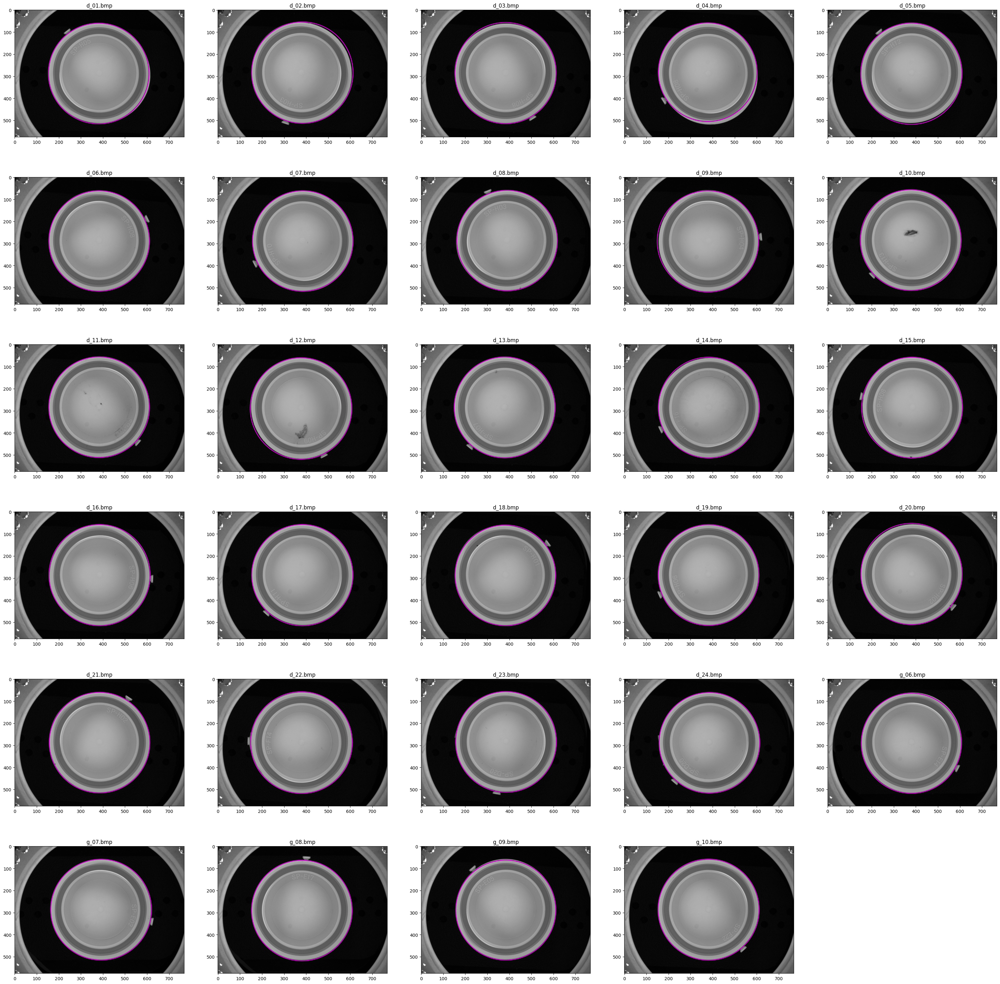

In [ ]:
plt.figure(figsize=(40,40))
    
for i, file_name in enumerate(sorted(listdir(folder_path))):
    if file_name.startswith("."):
        continue

    file_path=folder_path+file_name

    image = cv2.imread(file_path, cv2.COLOR_BGR2GRAY)
    _, image_bin = cv2.threshold(image.astype(np.uint8), 20, 255, cv2.THRESH_BINARY)

    center, radius = cap_outline(file_name, image_bin)

    ax = plt.subplot(int(np.ceil(len(listdir(folder_path))/imgs_per_line)), imgs_per_line, i)
    ax.set_title(file_name)
    circle = plt.Circle(center, radius, color='m', fill=False, linewidth=2)
    ax.add_patch(circle)
    ax.imshow(image, cmap='gray', vmin=0, vmax=255)
plt.show()

## Step 1.2: Generate a crop containing the cavity number. The crop should contain the cavity number and it should appear upright

### Step 1.2.1: Find the annular region

#### Alternatives considered

##### Using MinEnclosing circle

In [ ]:
def find_annular_region(radius_inside):
    edge_detected_image = cv2.Canny(image_bin, 600, 700) 
    contours, _ = cv2.findContours(edge_detected_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    fin_rad = 0
    for cnt in contours:
        (x,y),radius = cv2.minEnclosingCircle(cnt)
        center = (int(x),int(y))
        radius = int(radius)

        if radius > fin_rad and radius*1.5 < image.shape[1]/2 and center[0] > image.shape[0]/3 and center[0] < 3*image.shape[0]/4:
            fin_rad = radius
    
    return fin_rad

#### 1.2.1 Final choice

In [25]:
def find_annular_region(radius_insde):
    return radius_insde + 15

### Step 1.2.2: Mask the cap to get only the tab

In [26]:
def mask_cap(image_bin, center, radius_inside, radius_outside):
    mask = np.zeros(image_bin.shape[:2], dtype=np.uint8)
    cv2.circle(mask, center, radius_outside, (255), thickness=-1)
    cv2.circle(mask, center, radius_inside, (0), thickness=-1)
    circular_roi = cv2.bitwise_and(image_bin, image_bin, mask=mask)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    circular_roi_open = cv2.morphologyEx(circular_roi, cv2.MORPH_OPEN, kernel, iterations=2)
    return circular_roi_open

### Step 1.2.3: Find the tab and its centroid

In [27]:
def get_tab_center(file_name, roi):
    _, _, stats, centroids = cv2.connectedComponentsWithStats(roi)

    if len(centroids) > 2:
        print(f"{file_name}: Found {len(centroids) - 1} object in the anular region, they are too many")
        WIDTH = 2
        HEIGHT = 3
        AREA = 4
        best_index = -1
        best_rect = 0
        # The residual object are the tab and some arc region that is too big to be removed with the opening
        # We can find the tab looking at the most rectangular object 
        for j, stat in enumerate(stats[1:]): # Altrenativa a median: [x for x in stats[1:] if x[AREA] > 20]
            rect = stat[AREA] / (stat[WIDTH] * stat[HEIGHT])
            if rect > best_rect:
                best_rect = rect
                best_index = j+1 # we start from one to skip the background
        centroids = [centroids[0], centroids[best_index]]
    elif len(centroids) < 2:
        print("Tab not found!")
        sys.exit(1)

    # 0 is the backgorud, 1 is the tab
    return centroids[1]

### Step 1.2.4: Find the angle and rotate the image

In [31]:
def get_image_with_tap_upright(file_name, image_bin, center, radius_inside, radius_outside):
    circular_roi_opened = mask_cap(image_bin, center, radius_inside, radius_outside)
    tab_center = np.int16(np.around(get_tab_center(file_name, circular_roi_opened)))
    # Slope of the straight line that connects the center of the tab with the center of the cap
    m = (center[1] - tab_center[1]) / (center[0] - tab_center[0]) * 1.0

    # Find the angle between the green and the blue lines
    x = np.abs(tab_center[0]-center[0])
    y = np.abs(tab_center[1]-center[1])
    teta = np.arctan(x/y)

    # Form rad to deg
    rotation = (teta * 180 / np.pi)

    # Looking at the slope we choose the direction of the rotation
    if m > 0 :
        rotation = rotation * -1

    # Looking at the tab position we choose if we have to overturn
    if tab_center[1] > center[1]:
        rotation += 180
    
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, rotation, 1.0)
    image_with_vertical_tab = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
    return image_with_vertical_tab


### Step 1.2 Result

d_04.bmp: Found 2 object in the anular region, they are too many


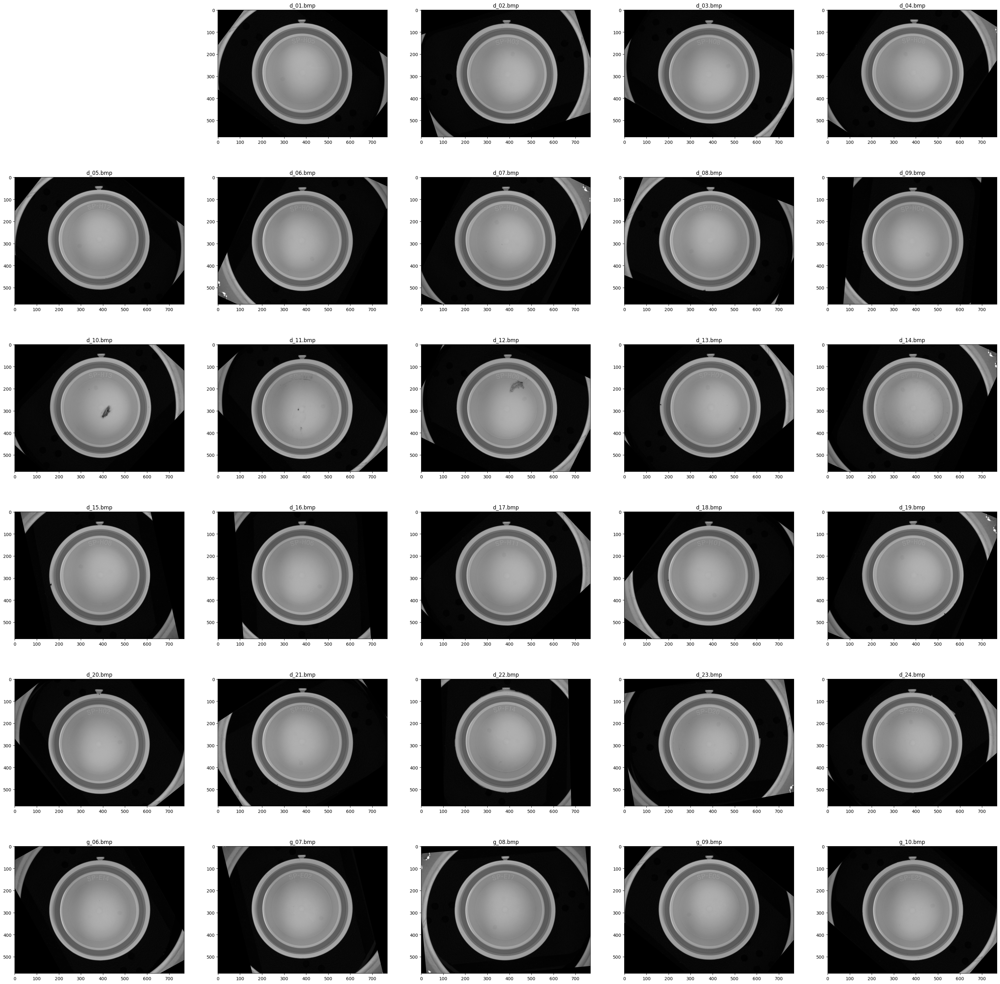

In [33]:
plt.figure(figsize=(40,40))
    
for i, file_name in enumerate(sorted(listdir(folder_path))):
    if file_name.startswith("."):
        continue

    file_path="./img/"+file_name

    image = cv2.imread(file_path, cv2.COLOR_BGR2GRAY)
    _, image_bin = cv2.threshold(image.astype(np.uint8), 20, 255, cv2.THRESH_BINARY)
    center, radius = cap_outline(file_name, image_bin)

    center = np.int16(np.around(center))
    radius_inside = int(np.ceil(radius))
    radius_outside = find_annular_region(radius_inside)

    image_with_vertical_tab = get_image_with_tap_upright(file_name, image_bin, center, radius_inside, radius_outside)

    ax = plt.subplot(int(np.ceil(len(listdir(folder_path))/imgs_per_line)), imgs_per_line, i+1)
    ax.set_title(file_name)
    ax.imshow(image_with_vertical_tab, cmap='gray', vmin=0, vmax=255)
plt.show()